In [1]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

import cv2
import glob
from skimage.metrics import structural_similarity as ssim
from sewar.full_ref import rmse, psnr, uqi

# Import helper functions from utils.py
import utils
import importlib
importlib.reload(utils)

# Save path
save_path = r"E:\SNU Chennai\projects\IVP\edge-detection-metrics\Evaluation metrics"

# Global variables
channels = ['Coastal \nAerosol','Blue','Green',
            'Red','Red Edge 1','Red Edge 2',
            'Red Edge 3','NIR','Red Edge 4',
            'Water \nVapour','SWIR 1','SWIR 2']

# LoG thresholds (threshold on LoG response magnitude)
log_thresholds = [5, 10, 15, 20, 25, 30]

# Test image paths
test_path = glob.glob(r"E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\*")
print(test_path[0])
print(len(test_path))

# Initialise processor
processor = utils.data_processor()

E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20190312T031541_N0211_R118_T48QYJ_20190312T083550_image_0_0.tif
98


In [2]:
# Load input data
def get_input(paths):
    input = []
    rgb = []
    labels = []

    for path in paths:
        try:
            img, rgb_img, label = processor.load_test(path)
            input.append(img)
            labels.append(label)
            rgb.append(rgb_img)
        except:
            print("Error with image: ", path)

    # Convert binary label to edge reference using Canny (fixed reference for evaluation)
    canny_input = [np.uint8(img * 255) for img in labels]
    edge_reference = [np.uint8(cv2.Canny(img, threshold1=100, threshold2=200)) for img in canny_input]

    return input, rgb, labels, edge_reference

input, rgb, labels, edge_reference = get_input(test_path)

c:\Users\sreen\anaconda3\envs\gdalpip\Lib\site-packages\osgeo\gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


Random sample index: 77


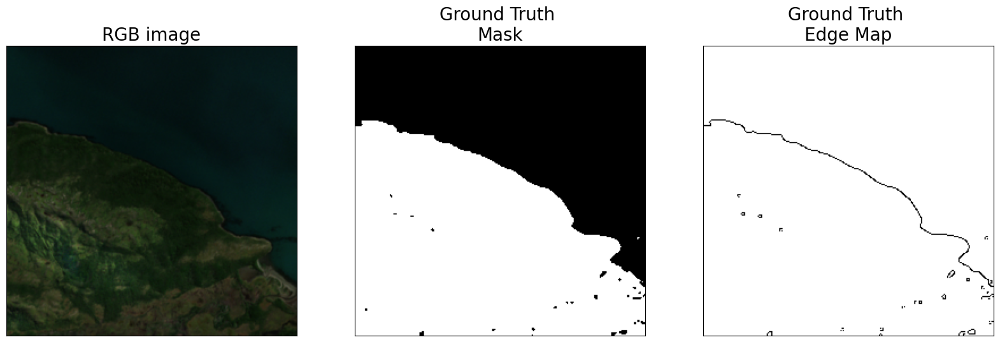

In [3]:
# Visual sample check
rint = np.random.randint(0, len(edge_reference))
print("Random sample index:", rint)

fig, ax = plt.subplots(1, 3, figsize=(20, 20))
fig.set_facecolor('white')

ax[0].imshow(rgb[rint])
ax[0].set_title('RGB image', size=20)
ax[1].imshow(1 - labels[rint], cmap='gray')
ax[1].set_title('Ground Truth \nMask', size=20)
ax[2].imshow(255 - edge_reference[rint], cmap='gray')
ax[2].set_title('Ground Truth \nEdge Map', size=20)

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

plt.savefig(save_path + '\\Figures\\log_dataset_example.png', dpi=300, bbox_inches='tight')


In [ ]:
# Apply LoG edge detection with thresholding
def get_log(input_images):
    log_input = input_images.copy()
    log = {}

    for thresh in log_thresholds:
        results = []
        for img in log_input:
            log_img = processor.preprocess(img)  # normalize each band
            out = np.zeros_like(log_img)
            for i in range(12):  # 12 bands
                band = log_img[:, :, i]
                blurred = cv2.GaussianBlur(band, (5, 5), 0)
                laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
                abs_lap = np.abs(laplacian)
                _, binary = cv2.threshold(abs_lap, thresh, 255, cv2.THRESH_BINARY)
                out[:, :, i] = binary.astype(np.uint8)
            results.append(out)
        log[str(thresh)] = results
        print(f"Threshold {thresh}: {len(results)} images processed.")
    return log

# Run LoG
log = get_log(input)

Threshold 5: 98 images processed.
Threshold 10: 98 images processed.
Threshold 15: 98 images processed.
Threshold 20: 98 images processed.
Threshold 25: 98 images processed.
Threshold 30: 98 images processed.


In [5]:
# Evaluate LoG outputs
rows = []

for threshold in log_thresholds:
    log_output = log[str(threshold)]

    for i, output in enumerate(log_output):
        ref_img = edge_reference[i]
        ID = i

        for j in range(len(channels)):
            img = output[:, :, j]

            # Evaluation metrics
            rmse_ = rmse(ref_img, img)
            psnr_ = psnr(ref_img, img)
            uqi_ = uqi(ref_img, img)
            ssim_ = ssim(ref_img, img, multichannel=True)
            fom_ = processor.fom(ref_img, img)
            tp_, fp_, tn_, fn_, tpr_, fpr_, tnr_, fnr_, fp_fn_ratio_ = processor.get_rates(ref_img, img)
            pde_ = np.count_nonzero(img) / np.count_nonzero(ref_img)

            row = [ID, threshold, j + 1, rmse_, psnr_, uqi_, ssim_, fom_,
                   tp_, fp_, tn_, fn_, tpr_, fpr_, tnr_, fnr_, fp_fn_ratio_, pde_]
            rows.append(row)

    print(f"Threshold {threshold} done")

# Save to CSV
df_metrics_log = pd.DataFrame(rows, columns=[
    'ID', "thresholds", "band", "rmse", "psnr", "uqi", "ssim", "fom",
    "tp", "fp", "tn", "fn", "tpr", "fpr", "tnr", "fnr", "fp_fn_ratio", "pde"
])

df_metrics_log.to_csv(save_path + "\\log_evaluation_metrics.csv", index=False)
df_metrics_log.head()

Threshold 5 done
Threshold 10 done
Threshold 15 done
Threshold 20 done
Threshold 25 done
Threshold 30 done


,ID,thresholds,band,rmse,psnr,uqi,ssim,fom,tp,fp,tn,fn,tpr,fpr,tnr,fnr,fp_fn_ratio,pde
0,0,5,1,70.159232,11.209107,0.637337,0.655704,0.513467,325,2856,60250,2105,0.133745,0.045257,0.954743,0.866255,1.356770,1.309053
1,0,5,2,72.953243,10.869912,0.636098,0.647952,0.520428,357,3291,59815,2073,0.146914,0.052150,0.947850,0.853086,1.587554,1.501235
2,0,5,3,75.282549,10.596917,0.643875,0.653702,0.516133,425,3707,59399,2005,0.174897,0.058742,0.941258,0.825103,1.848878,1.700412
3,0,5,4,83.576955,9.689073,0.603894,0.608406,0.493420,502,5112,57994,1928,0.206584,0.081007,0.918993,0.793416,2.651452,2.310288
4,0,5,5,78.426175,10.241583,0.640996,0.643604,0.534752,461,4230,58876,1969,0.189712,0.067030,0.932970,0.810288,2.148299,1.930453


Removed paths:
 E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20190725T072621_N0213_R049_T37MER_20190725T114710_image_0_0.tif 
 E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20191003T022551_N0213_R046_T49MGM_20191003T062924_image_0_3.tif 
 E:\SNU Chennai\projects\IVP\edge-detection-metrics\SWED\SWED\test\images\S2A_MSIL2A_20191226T071311_N0213_R106_T39RWH_20191226T094655_image_0_1.tif
Threshold 5: 95 images processed.
Threshold 10: 95 images processed.
Threshold 15: 95 images processed.
Threshold 20: 95 images processed.
Threshold 25: 95 images processed.
Threshold 30: 95 images processed.


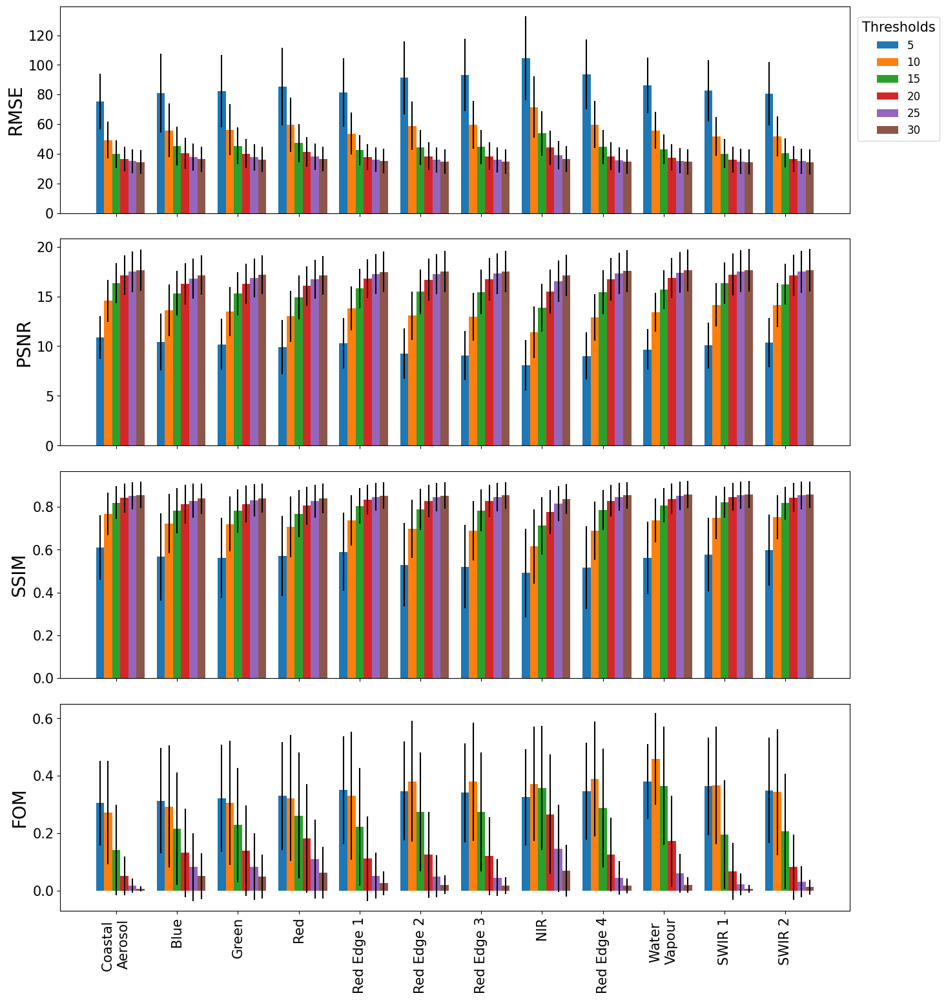

In [6]:
# --- Load LoG Evaluation CSV ---
df_metrics_log = pd.read_csv(save_path + "\\log_evaluation_metrics.csv")

# --- Add derived column: FP + FN ---
df_metrics_log['fp_fn'] = df_metrics_log['fp'] + df_metrics_log['fn']

# --- Remove known bad IDs ---
df_metrics_log_2 = df_metrics_log.copy()
df_metrics_log_2 = df_metrics_log_2.drop(df_metrics_log_2[df_metrics_log_2['ID'] == 18].index)
df_metrics_log_2 = df_metrics_log_2.drop(df_metrics_log_2[df_metrics_log_2['ID'] == 41].index)
df_metrics_log_2 = df_metrics_log_2.drop(df_metrics_log_2[df_metrics_log_2['ID'] == 66].index)

# --- Ensure thresholds are strings for matching in visualizer ---
df_metrics_log_2['thresholds'] = df_metrics_log_2['thresholds'].astype(str)

# --- Remove paths at same indices ---
test_paths_2 = test_path.copy()
path1 = test_paths_2.pop(18)
path2 = test_paths_2.pop(41 - 1)
path3 = test_paths_2.pop(66 - 2)
print("Removed paths:\n", path1, "\n", path2, "\n", path3)

# --- Recompute inputs and edge references for filtered dataset ---
input_2, rgb_2, labels_2, edge_reference_2 = get_input(test_paths_2)

# --- Recompute LoG edges on filtered inputs ---
def get_log(input_images):
    log_input = input_images.copy()
    log = {}

    for thresh in log_thresholds:
        results = []
        for img in log_input:
            log_img = processor.preprocess(img)  # normalize per band
            out = np.zeros_like(log_img)
            for i in range(12):  # 12 bands
                band = log_img[:, :, i]
                blurred = cv2.GaussianBlur(band, (5, 5), 0)
                laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
                abs_lap = np.abs(laplacian)
                _, binary = cv2.threshold(abs_lap, thresh, 255, cv2.THRESH_BINARY)
                out[:, :, i] = binary.astype(np.uint8)
            results.append(out)
        log[str(thresh)] = results
        print(f"Threshold {thresh}: {len(results)} images processed.")
    return log

log_2 = get_log(input_2)

# --- Convert LoG thresholds to string for the visualizer ---
log_thresholds_str = [str(t) for t in log_thresholds]

# --- Initialize visualizer for LoG ---
viz_log = utils.data_visualizer(df_metrics_log_2, log_2, edge_reference_2, rgb_2, log_thresholds_str, channels)

# --- Plot combined trend chart for LoG ---
viz_log.plot_combined_metric_trends(['rmse', 'psnr', 'ssim', 'fom'],
                                     save_path=save_path + "\\Figures\\log_all_metrics.png")


In [7]:
# --- Filter only NIR band (band 7) ---
df_metrics_log_nir = df_metrics_log_2[df_metrics_log_2['band'] == 7]

# --- Mean evaluation metrics per threshold ---
df_mean_log = df_metrics_log_nir[['thresholds', 'rmse', 'psnr', 'ssim', 'fom']].groupby('thresholds').mean().reset_index()

# Convert 'thresholds' column to integer for sorting and display
df_mean_log['Threshold'] = df_mean_log['thresholds'].astype(int)

# Sort and reformat
df_mean_log = df_mean_log.sort_values(by='Threshold')[['Threshold', 'rmse', 'psnr', 'ssim', 'fom']]
df_mean_log.columns = ['Threshold', 'RMSE', 'PSNR', 'SSIM', 'FOM']
df_mean_log = df_mean_log.round(2)

# --- Copy to clipboard (optional) ---
df_mean_log.to_clipboard(index=False)
df_mean_log.head()


,Threshold,RMSE,PSNR,SSIM,FOM
5,5,93.16,9.08,0.52,0.34
0,10,59.62,12.94,0.69,0.38
1,15,44.62,15.43,0.78,0.27
2,20,38.34,16.71,0.83,0.12
3,25,35.86,17.28,0.85,0.05


In [8]:
# --- Initialize threshold count dataframe for LoG ---
best_threshold_count_log = pd.DataFrame({'Threshold': log_thresholds})

# --- Count how many times each LoG threshold is best for each metric ---
for metric in ['rmse', 'psnr', 'ssim', 'fom']:
    df = df_metrics_log_2[['ID', 'thresholds', metric]]

    # Get best performing threshold per image
    if metric == 'rmse':
        best_thresholds = df.loc[df.groupby('ID')[metric].idxmin()]
    else:
        best_thresholds = df.loc[df.groupby('ID')[metric].idxmax()]

    # Count threshold occurrences
    count = []
    print(f"\nBest thresholds for {metric.upper()}:")
    for threshold in log_thresholds:
        df_thresh = best_thresholds[best_thresholds['thresholds'] == str(threshold)]
        count.append(len(df_thresh))
        print(f"Threshold {threshold}: {len(df_thresh)} occurrences")

    best_threshold_count_log[metric.upper()] = count

# --- Copy to clipboard (optional) ---
best_threshold_count_log.to_clipboard(index=False)
best_threshold_count_log



Best thresholds for RMSE:
Threshold 5: 0 occurrences
Threshold 10: 0 occurrences
Threshold 15: 0 occurrences
Threshold 20: 2 occurrences
Threshold 25: 8 occurrences
Threshold 30: 85 occurrences

Best thresholds for PSNR:
Threshold 5: 0 occurrences
Threshold 10: 0 occurrences
Threshold 15: 0 occurrences
Threshold 20: 2 occurrences
Threshold 25: 8 occurrences
Threshold 30: 85 occurrences

Best thresholds for SSIM:
Threshold 5: 0 occurrences
Threshold 10: 1 occurrences
Threshold 15: 0 occurrences
Threshold 20: 2 occurrences
Threshold 25: 10 occurrences
Threshold 30: 82 occurrences

Best thresholds for FOM:
Threshold 5: 13 occurrences
Threshold 10: 43 occurrences
Threshold 15: 33 occurrences
Threshold 20: 5 occurrences
Threshold 25: 1 occurrences
Threshold 30: 0 occurrences


,Threshold,RMSE,PSNR,SSIM,FOM
0,5,0,0,0,13
1,10,0,0,1,43
2,15,0,0,0,33
3,20,2,2,2,5
4,25,8,8,10,1
5,30,85,85,82,0


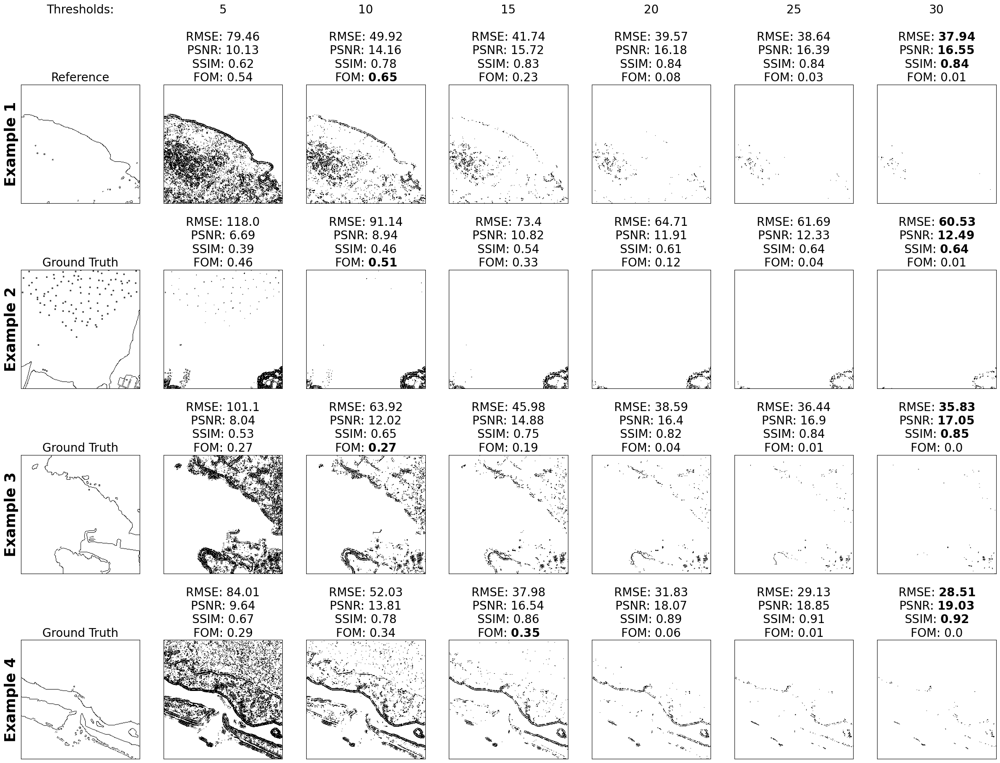

In [9]:
# --- Convert 'thresholds' column to string for matching ---
df_metrics_log_2["thresholds"] = df_metrics_log_2["thresholds"].astype(str)

# --- Select image IDs where FOM performs meaningfully ---
IDs = [74, 40, 2, 68]

# --- Plot and save LoG edge examples using the LoG visualizer ---
viz_log.example_plots(IDs, save_path=save_path + "\\Figures\\log_good_examples.png")


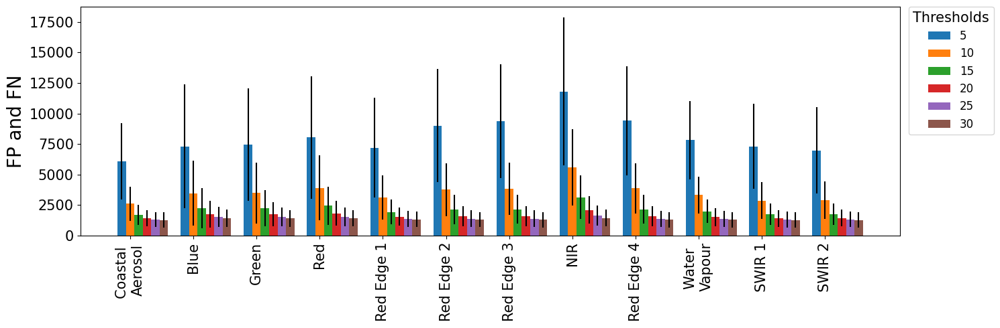

In [10]:
import importlib
importlib.reload(utils)

# --- FP + FN trend plot ---
df_metrics_log_2["thresholds"] = df_metrics_log_2["thresholds"].astype(str)
viz_log.plot_metric_trends('fp_fn', ylabel="FP and FN", save_path=save_path + "\\Figures\\log_fp_fn_sum.png")


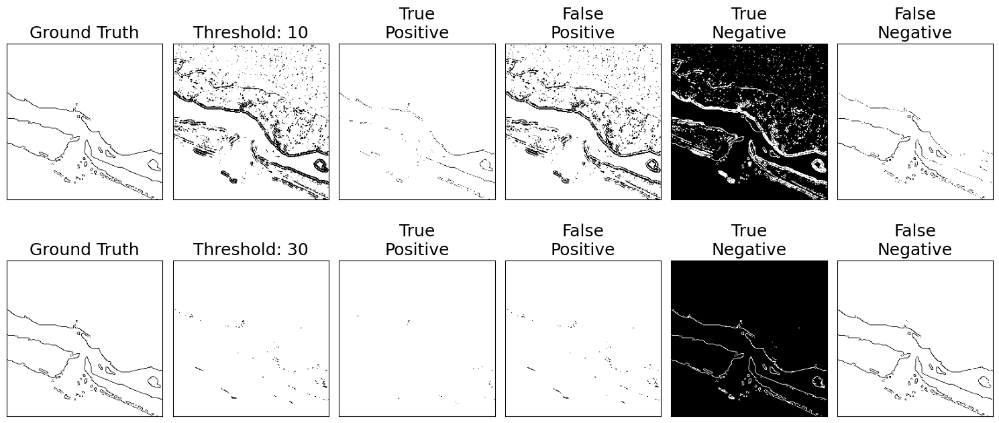

In [11]:

# --- TP/FP/TN/FN visual example ---
rint = 68
band = 7
thresholds_to_plot = [10, 30]  # LoG thresholds

fig, axs = plt.subplots(2, 6, figsize=(15, 7))
fig.set_facecolor('white')

for i, threshold in enumerate(thresholds_to_plot):
    reference = edge_reference_2[rint].astype(float)
    detected = log_2[str(threshold)][rint][:, :, band].astype(float)

    TP = reference - (255 - detected)
    TP[TP < 0] = 0
    FP = detected - TP
    TN = (255 - reference) - detected
    TN[TN < 0] = 0
    FN = (255 - detected) - (255 - reference)
    FN[FN < 0] = 0

    axs[i, 0].imshow(255 - reference, cmap="gray")
    axs[i, 0].set_title("Ground Truth", size=18)

    axs[i, 1].imshow(255 - detected, cmap="gray")
    axs[i, 1].set_title(f"Threshold: {threshold}", size=18)

    axs[i, 2].imshow(255 - TP, cmap="gray")
    axs[i, 2].set_title("True\nPositive", size=18)

    axs[i, 3].imshow(255 - FP, cmap="gray")
    axs[i, 3].set_title("False\nPositive", size=18)

    axs[i, 4].imshow(255 - TN, cmap="gray")
    axs[i, 4].set_title("True\nNegative", size=18)

    axs[i, 5].imshow(255 - FN, cmap="gray")
    axs[i, 5].set_title("False\nNegative", size=18)

for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(save_path + "\\Figures\\log_TP_FP_example.png", dpi=300)


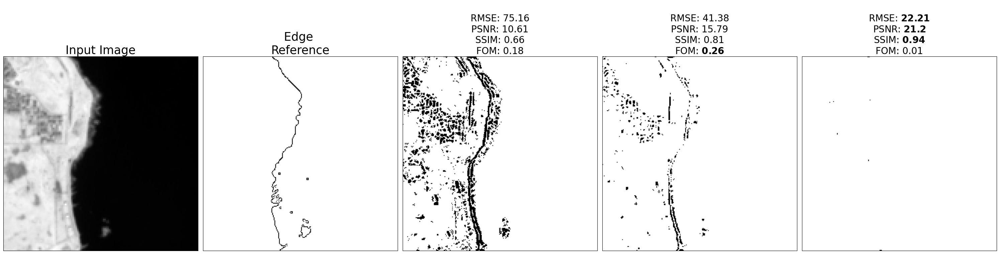

In [12]:

# --- Threshold comparison plot with metric overlays ---
fig, axs = plt.subplots(1, 5, figsize=(30, 20))
fig.set_facecolor('white')

rint = 67
thresholds = [5, 10, 20]
band = 10

img_input = input[rint].copy()

axs[0].imshow(img_input[:, :, band], cmap="gray")
axs[0].set_title("Input Image", size=25)

ref_img = edge_reference[rint]
axs[1].imshow(255 - ref_img, cmap="gray")
axs[1].set_title("Edge \nReference", size=25)

processor = utils.data_processor()
log_input = processor.preprocess(img_input)
band_img = log_input[:, :, band]

for i, t in enumerate(thresholds):
    blurred = cv2.GaussianBlur(band_img, (5, 5), 0)
    laplacian = cv2.Laplacian(blurred, cv2.CV_64F)
    abs_lap = np.abs(laplacian)
    _, binary_img = cv2.threshold(abs_lap, t, 255, cv2.THRESH_BINARY)
    binary_img = binary_img.astype(np.uint8)

    axs[i + 2].imshow(255 - binary_img, cmap="gray")

    rmse_ = round(rmse(ref_img, binary_img), 2)
    psnr_ = round(psnr(ref_img, binary_img), 2)
    ssim_ = round(ssim(ref_img, binary_img, multichannel=True), 2)
    fom_ = round(processor.fom(ref_img, binary_img), 2)

    if i == 0:
        axs[i + 2].set_title(f"\nRMSE: {rmse_}\nPSNR: {psnr_}\nSSIM: {ssim_}\nFOM: {fom_}", size=20)
    elif i == 1:
        axs[i + 2].set_title(f"\nRMSE: {rmse_}\nPSNR: {psnr_}\nSSIM: {ssim_}\nFOM: " + r"$\bf{" + str(fom_) + "}$", size=20)
    else:
        axs[i + 2].set_title(
            "\nRMSE: " + r"$\bf{" + str(rmse_) + "}$" +
            "\nPSNR: " + r"$\bf{" + str(psnr_) + "}$" +
            "\nSSIM: " + r"$\bf{" + str(ssim_) + "}$" +
            "\nFOM: " + str(fom_), size=20
        )

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig(save_path + "\\Figures\\log_threshold_comparison.png", dpi=300)
plt.show()


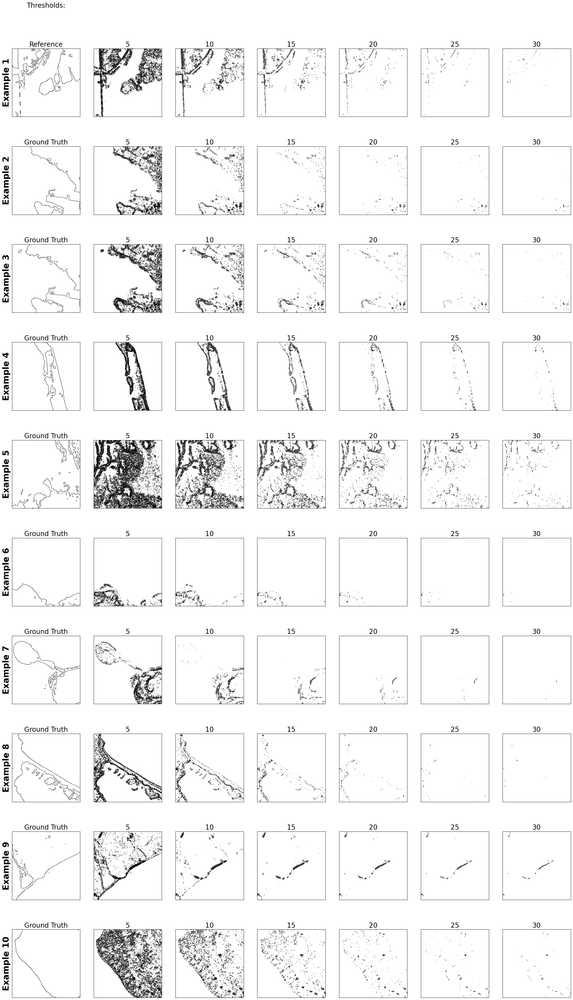

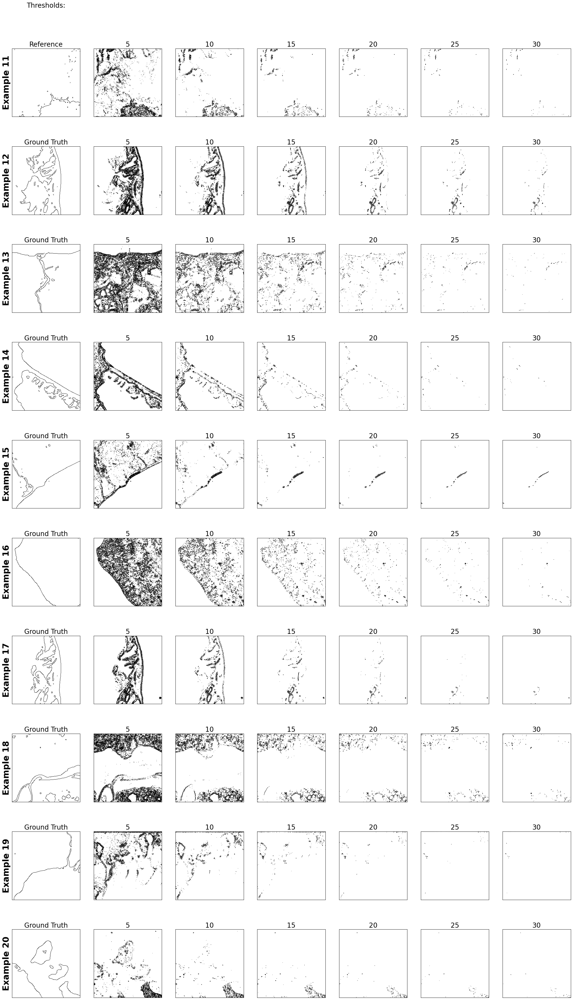

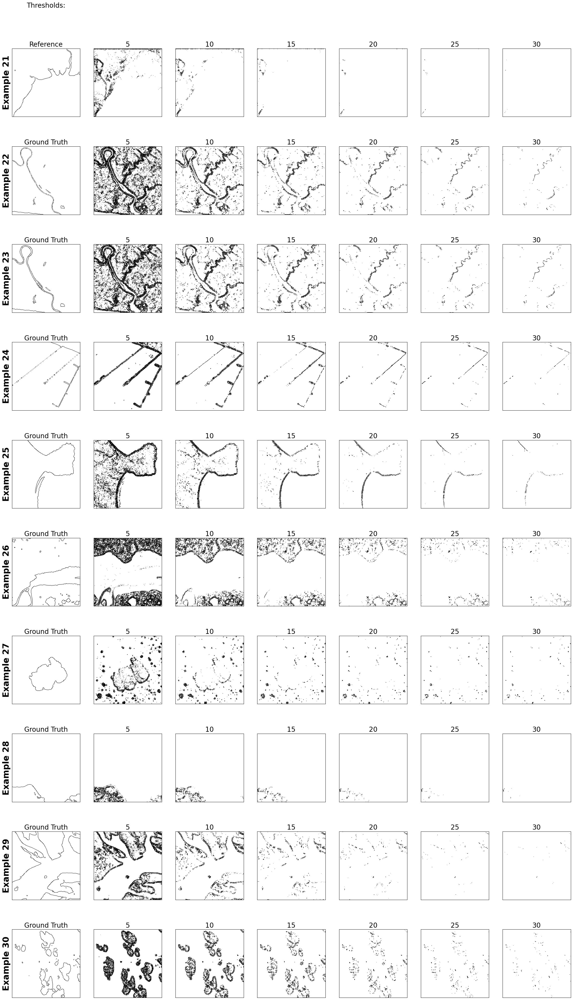

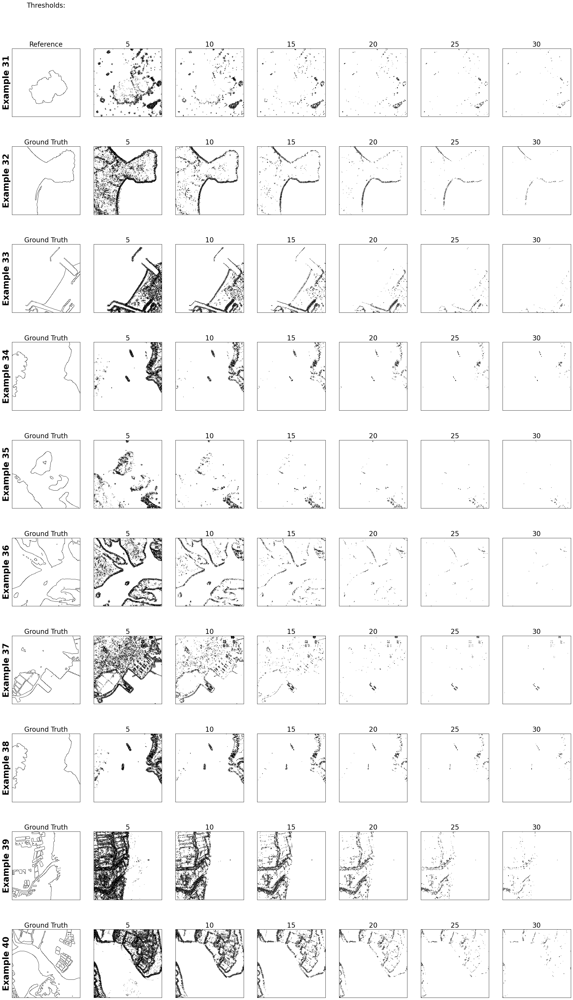

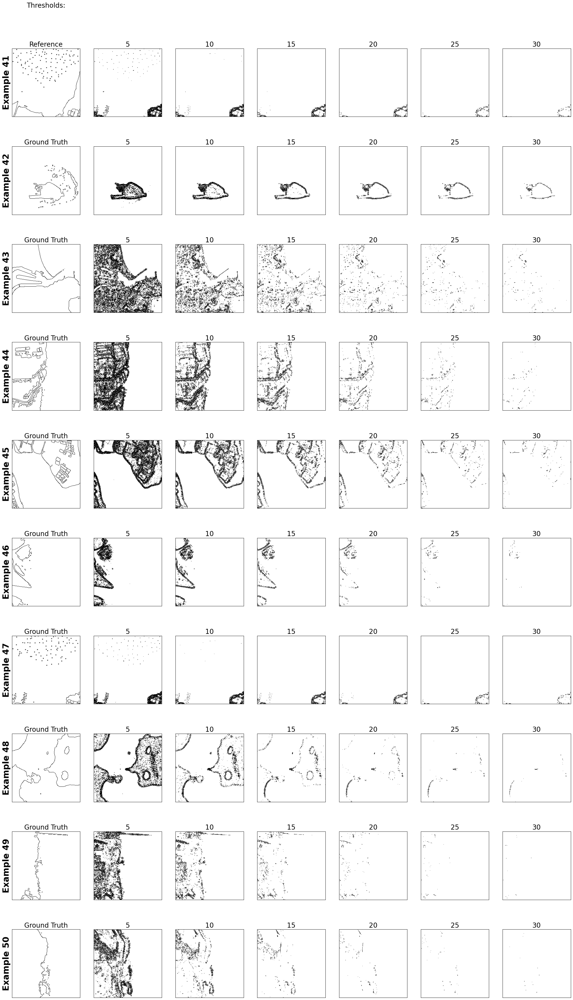

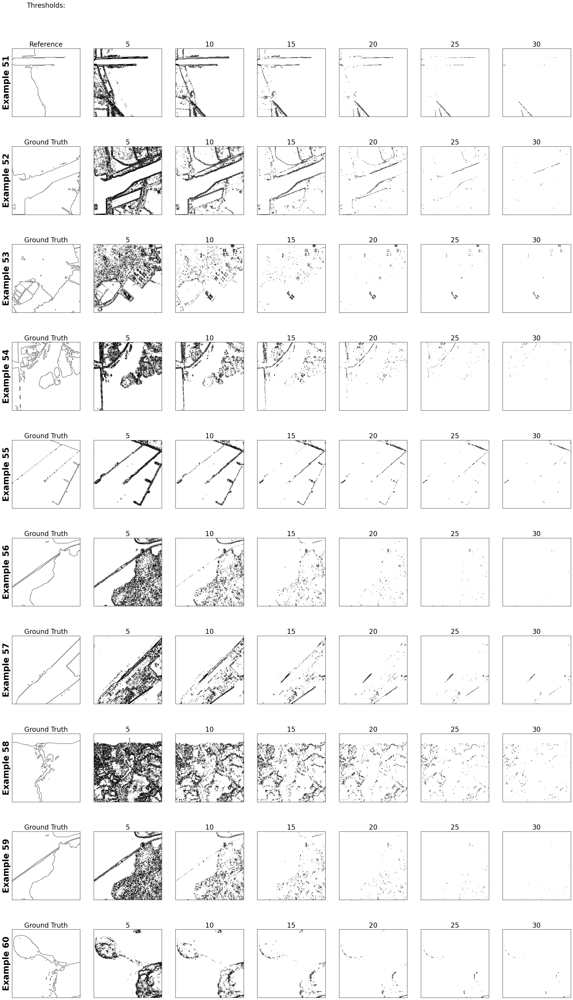

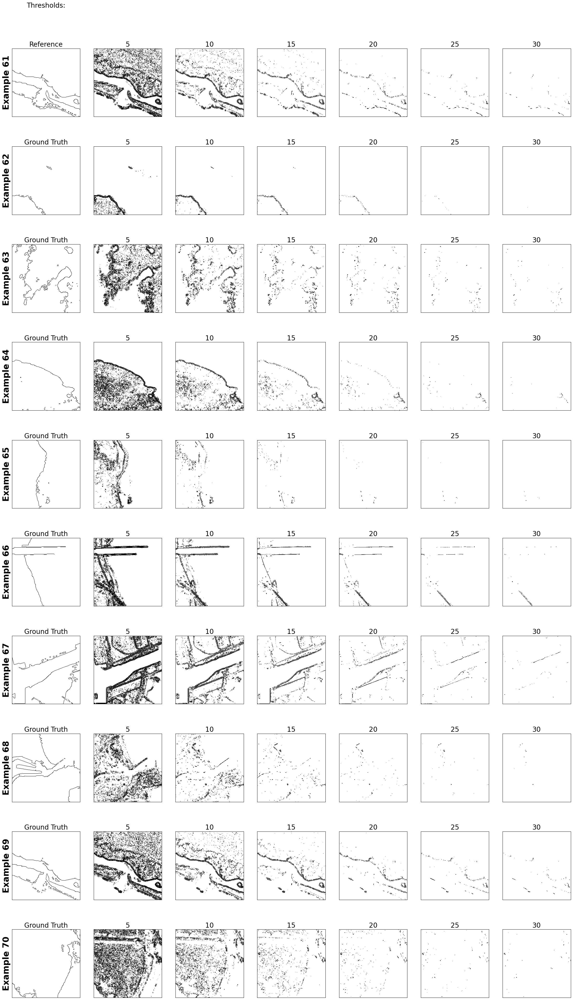

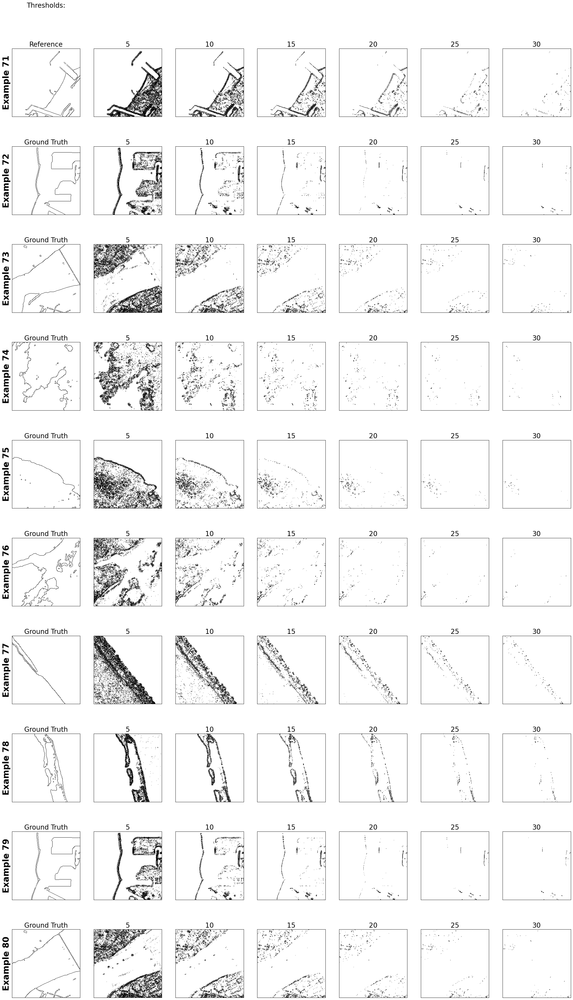

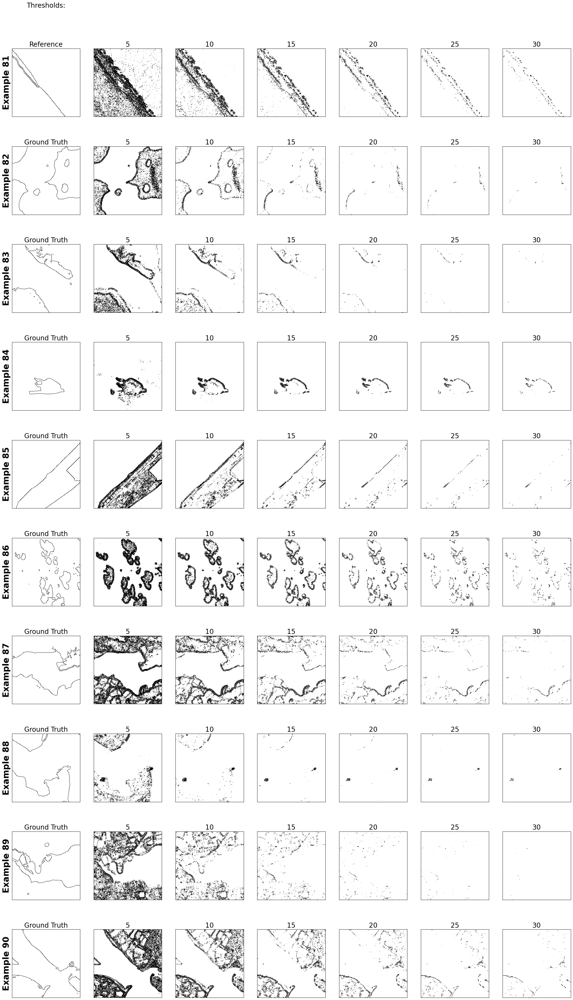

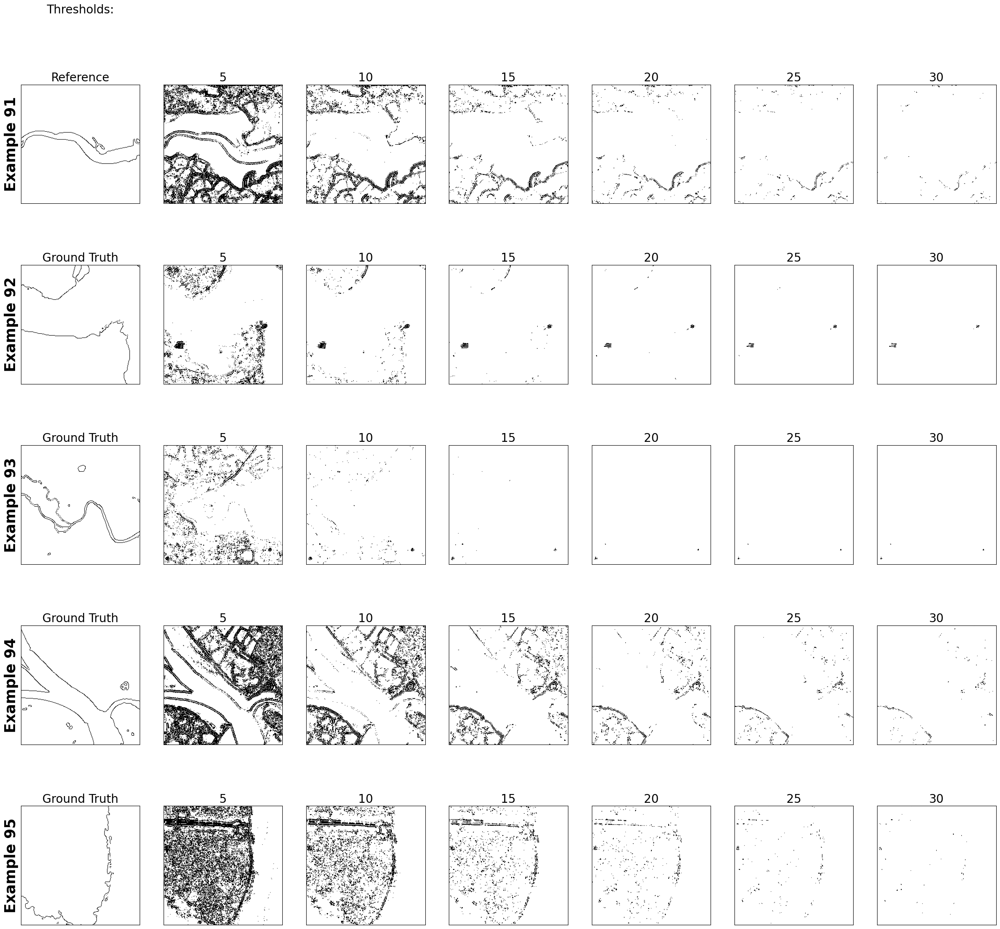

In [14]:

# --- Get image names for visual inspection ---
x = [path.split("/")[-1] for path in test_path]
df = pd.DataFrame({"ID": x})
df.to_clipboard(index=False)

'''# --- Visual inspection across image groups ---
ALL_IDS = [
    list(range(0, 10)), list(range(10, 20)), list(range(20, 30)),
    list(range(30, 40)), list(range(40, 50)), list(range(50, 60)),
    list(range(60, 70)), list(range(70, 80)), list(range(80, 90)),
    list(range(90, 98))
]

for i, IDs in enumerate(ALL_IDS):
    viz_log.example_plots(IDs, ex_diff=10 * i, show_metrics=False,
                          save_path=save_path + f"\\Figures\\log_group_{i+1}.png")'''
# Recalculate ALL_IDS based on actual filtered dataset size
num_images = len(test_paths_2)  # Should be 95 after removing 3
group_size = 10

ALL_IDS = [list(range(i, min(i + group_size, num_images))) for i in range(0, num_images, group_size)]
for i, IDs in enumerate(ALL_IDS):
    viz_log.example_plots(IDs, ex_diff=10 * i, show_metrics=False,
                          save_path=save_path + f"\\Figures\\log_group_{i+1}.png")
